# Monkey Classification

    The monkey species classification tasks from Kaggle https://www.kaggle.com/slothkong/10-monkey-species/home involves recognising 10 different species of monkey from disparate image types. The task is to build an accurate classification model for this scenario using different types of CNN model.

In [1]:
import os 
import csv
# import cv2
import random
import numpy as np
import pandas as pd

import torch
import torchvision
import torch.nn as nn
import torchvision.datasets as datasets
from torchvision.transforms import transforms
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import torch.optim as optim
from torchvision.models import vgg16

from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

import matplotlib.pyplot as plt
%matplotlib inline 

### Loading dataset and training ML model

#### codes in this notebook adopted from lecture notes

In [18]:
# Dataset name
dataset_name = '10-monkey-species'

# A sampling rate to allow undersampling for fast execuation
sample_rate = 0.5

# Define proportion of data for test, train and validation splits. 
train_split = 0.5
valid_split = 0.2
test_split = 0.3

# Desired dimensions of our images.
img_width, img_height = 128, 128

In [19]:
# Define a Pytorch transformation to resize images to a standard size and convert them to a tensor representation. 
transformations = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor(), # Convert the image to a PyTorch Tensor.#this does scalling as well.
])

In [20]:
# Load the data
dataset = datasets.ImageFolder("./" + dataset_name + "/", 
                               transform = transformations)

# Resample the data set
resampled_size = int(sample_rate * len(dataset))
resampled_dataset, _ = random_split(dataset, [resampled_size, len(dataset) - resampled_size])

# Split the data into train, validation and test sets
test_size = int(test_split * len(resampled_dataset))
train_val_size = int(0.7 * len(resampled_dataset))
train_val_size = len(resampled_dataset) - test_size
train_val_dataset, test_dataset = random_split(resampled_dataset, [train_val_size, test_size])

train_size = int((train_split/(train_split + valid_split)) * len(train_val_dataset))
val_size = len(train_val_dataset) - train_size
train_dataset, val_dataset = random_split(train_val_dataset, [train_size, val_size])

In [21]:
batch_size = 32  # Batch size used during training

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size)

In [22]:
items = iter(train_loader)
image, label = next(items)

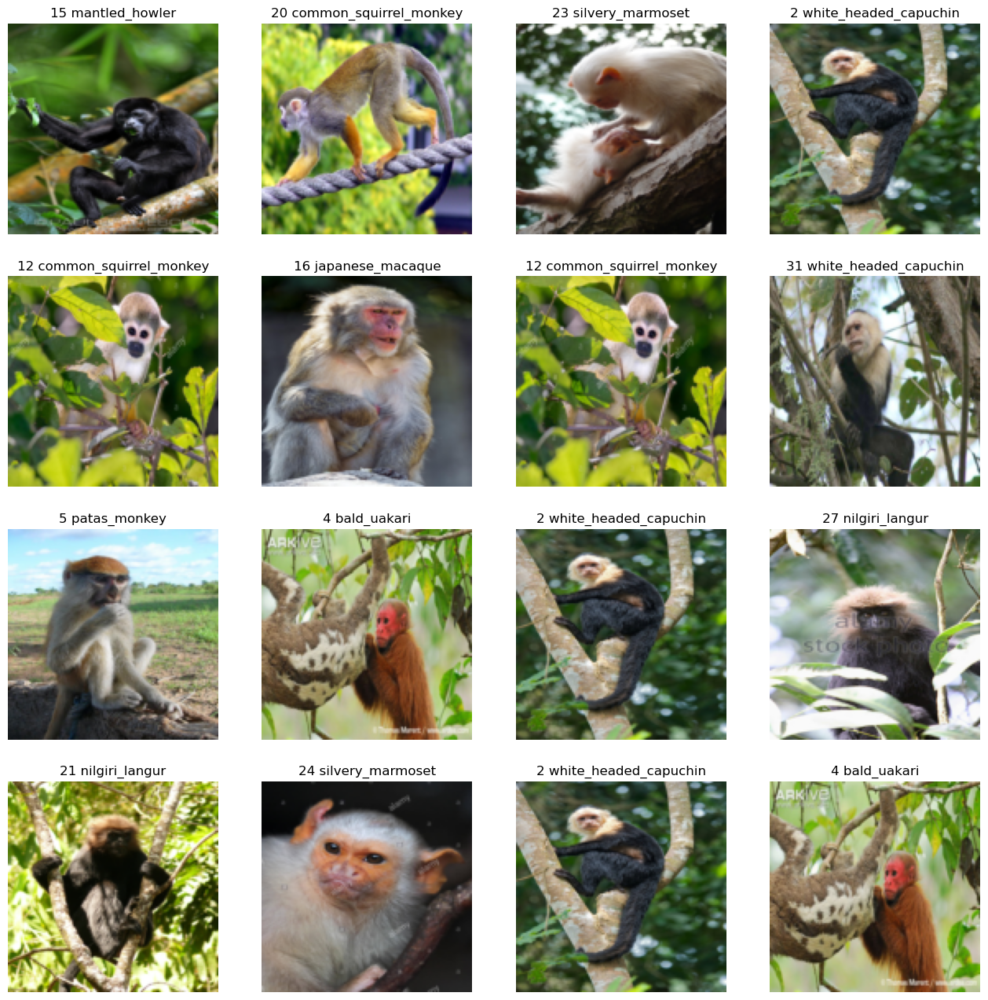

In [23]:
pltsize=4
row_images = 4
col_images = 4
label_names = dataset.classes

plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(row_images * col_images):
    i_rand = random.randint(0, len(image) - 1)
    np_image = image.numpy()
    np_label = label.numpy()
    plt.subplot(row_images,col_images,i+1)
    plt.axis('off')
    plt.imshow(np.transpose(np_image[i_rand], (1, 2, 0)))
    plt.title((str(i_rand) + " " + label_names[np_label[i_rand]]))

In [24]:
#Inspect the mapping from class labels to class numbers.
dataset.class_to_idx

{'bald_uakari': 0,
 'black_headed_night_monkey': 1,
 'common_squirrel_monkey': 2,
 'japanese_macaque': 3,
 'mantled_howler': 4,
 'nilgiri_langur': 5,
 'patas_monkey': 6,
 'pygmy_marmoset': 7,
 'silvery_marmoset': 8,
 'white_headed_capuchin': 9}

### Training basic LeNet type CNN model

( referance for hyperparameters of LeNet type CNN: "https://en.wikipedia.org/wiki/LeNet" )
Note on change to padding hyperparameter and adjusting input for using rgb data: LeNet is made to classify low resolution black and white images. (single channel, 28x 28 pixel images fed in to model during training at original LeNet implementation) Since my dataset it rgb and high resolution I will adjust padding to fit kernel size of 5 in LeNet model and fed 3 channel to model instead of 1.

In [95]:
class CNN(nn.Module):
    
    # Defining the Constructor
    def __init__(self, num_classes=10):
        super(CNN, self).__init__()
        
        # In the init function, we define the layers will be used in our model
        # We first create a sequential model object to store the layers
        self.layers = nn.Sequential()
        
        # The first convolutional layer takes 3 input channels and includes 6 convolutions
        self.layers.add_module('conv1',
                               nn.Conv2d(in_channels=3, out_channels=6,
                                         kernel_size=5, stride=1, padding=2))

        # Add a RELU activation
        self.layers.add_module('relu1',
                               nn.Tanh())
        
        # Apply max pooling with a kernel size of 2
        self.layers.add_module('pool1', 
                               nn.MaxPool2d(kernel_size=2))
                                              
        # The second convolutional layer takes 6 input channels and includes 16 convolutions
        self.layers.add_module('conv2',
                               nn.Conv2d(in_channels=6, out_channels=16, 
                                         kernel_size=5, stride=1, padding=2))
        
        # Add a RELU activation
        self.layers.add_module('relu2', 
                               nn.Tanh())
        
        # Apply max pooling with a kernel size of 2
        self.layers.add_module('pool2', 
                               nn.MaxPool2d(kernel_size=2))

        
        # We need to flatten these in order to feed them to a fully-connected layer
        self.layers.add_module('flatten1', 
                               nn.Flatten())                               

        # Our 128x128 image tensors will be pooled twice with a kernel size of 2. therefore, 128/2/2 is 32.
        # This means that the output of the second convolutional layer will be 32x32x16.
        self.layers.add_module('fc1',  
                               nn.Linear(in_features = 16 * 32 * 32, 
                                         out_features=120))
         
        # Add a RELU activation
        self.layers.add_module('relu3', 
                               nn.Tanh())
        
        self.layers.add_module('fc2',  
                       nn.Linear(in_features = 120, 
                                 out_features=84))
         
        # Add a RELU activation
        self.layers.add_module('relu4', 
                               nn.Tanh())
        
        # the final output layer                       
        self.layers.add_module('fc3', 
                               nn.Linear(in_features = 84, 
                                         out_features = num_classes))

    def forward(self, x):
       
        return self.layers(x)

In [96]:
model = CNN(num_classes = len(dataset.class_to_idx))
print(model)

CNN(
  (layers): Sequential(
    (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (relu1): Tanh()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (relu2): Tanh()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (flatten1): Flatten(start_dim=1, end_dim=-1)
    (fc1): Linear(in_features=16384, out_features=120, bias=True)
    (relu3): Tanh()
    (fc2): Linear(in_features=120, out_features=84, bias=True)
    (relu4): Tanh()
    (fc3): Linear(in_features=84, out_features=10, bias=True)
  )
)


In [97]:
#Train Model

#Define the model training loop keeping track of some key attributes along the way.
# Number of epochs to train
epochs = 5

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Define lists to store the training and validation loss and accuracy for each epoch
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
   
    model.train()

    # Initialize the training loss and accuracy for this epoch
    running_train_loss = 0.0
    running_train_corrects = 0

    running_val_loss = 0.0
    running_val_corrects = 0

    for i, (X_train, y_train) in enumerate(train_loader):
        
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

        # Compute statistics
        running_train_loss += loss.item() * batch_size
        running_train_corrects += torch.sum(torch.argmax(outputs, dim=1) == y_train)
    
    # Compute statistics for the entire epoch
    epoch_train_loss = running_train_loss / train_size
    epoch_train_acc = running_train_corrects.item() / train_size * 100

    # Append the training statistics to the lists
    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_acc)
    
    # Evaluation on validation set
    with torch.no_grad():
        for i, (X_val, y_val) in enumerate(val_loader):
            val_outputs = model(X_val)
            val_loss = criterion(val_outputs, y_val)
            val_corrects = torch.sum(torch.argmax(val_outputs, dim=1) == y_val)

            # Compute statistics
            running_val_loss += val_loss.item() * batch_size
            running_val_corrects += torch.sum(torch.argmax(val_outputs, dim=1) == y_val)

              
    # Compute statistics for the entire epoch
    epoch_val_loss = running_val_loss / val_size
    epoch_val_acc = running_val_corrects.item() / val_size * 100

    # Append the validation statistics to the lists
    val_losses.append(epoch_val_loss)
    val_accuracies.append(epoch_val_acc)

    print(f'Epoch {epoch+1}/{epochs}, Training Loss: {epoch_train_loss:.4f}, Training Accuracy: {epoch_train_acc:.2f}%, \
          Validation Loss: {epoch_val_loss:.4f}, Validation Accuracy: {epoch_val_acc:.2f}%')

Epoch 1/5, Training Loss: 2.2928, Training Accuracy: 17.25%,           Validation Loss: 2.3656, Validation Accuracy: 28.47%
Epoch 2/5, Training Loss: 1.8249, Training Accuracy: 39.18%,           Validation Loss: 2.2364, Validation Accuracy: 31.39%
Epoch 3/5, Training Loss: 1.5080, Training Accuracy: 52.92%,           Validation Loss: 2.0969, Validation Accuracy: 35.04%
Epoch 4/5, Training Loss: 1.2214, Training Accuracy: 70.76%,           Validation Loss: 1.9894, Validation Accuracy: 37.23%
Epoch 5/5, Training Loss: 0.8843, Training Accuracy: 84.50%,           Validation Loss: 1.8715, Validation Accuracy: 41.61%


### 4. Evaluating the performance of LeNet type CNN model

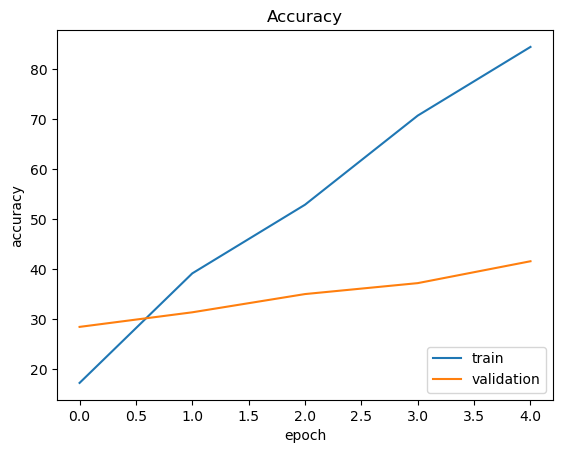

In [98]:
# Summarize history for accuracy
plt.plot(train_accuracies)
plt.plot(val_accuracies)
plt.title('Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
#plt.ylim((0, 1.1))
plt.show()

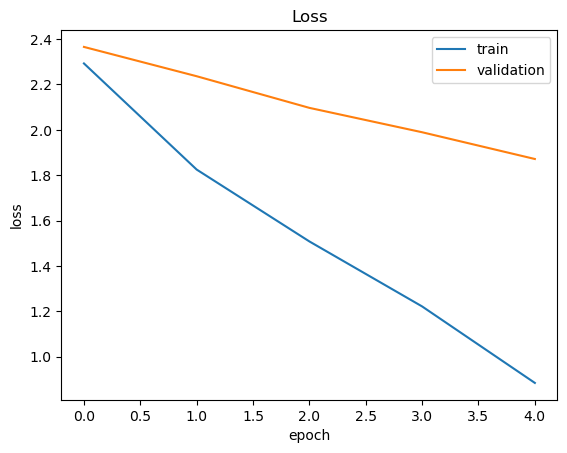

In [99]:
# Summarize history for loss
plt.plot(train_losses)
plt.plot(val_losses)
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
# plt.ylim((-0.1, 1.2))
plt.show()

In [100]:
X_test_cat = []
y_true = []
y_pred = []
for i, (X_test, y_test) in enumerate(test_loader):
    test_outputs = model(X_test)
    _, preds = torch.max(test_outputs, 1)

    # Add up the predictions
    X_test_cat.extend(X_test)
    y_true.extend(y_test)
    y_pred.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Print performance details
print(metrics.classification_report(y_true, y_pred))

# Print confusion matrix 
print("Confusion Matrix")
display(pd.crosstab(y_true, y_pred, rownames=['True'], colnames=['Predicted'], margins=True))

              precision    recall  f1-score   support

           0       0.64      0.64      0.64        22
           1       0.67      0.11      0.19        18
           2       0.30      0.59      0.40        22
           3       0.64      0.59      0.62        27
           4       0.52      0.68      0.59        19
           5       0.58      0.37      0.45        19
           6       0.40      0.48      0.43        21
           7       0.50      0.30      0.37        27
           8       0.60      0.56      0.58        16
           9       0.26      0.36      0.30        14

    accuracy                           0.47       205
   macro avg       0.51      0.47      0.46       205
weighted avg       0.52      0.47      0.47       205

Confusion Matrix


Predicted,0,1,2,3,4,5,6,7,8,9,All
True,,,,,,,,,,,
0,14,0,1,0,1,0,1,3,0,2,22
1,0,2,8,1,2,0,1,2,0,2,18
2,2,0,13,0,0,0,3,1,1,2,22
3,0,0,2,16,1,0,2,1,4,1,27
4,1,0,0,0,13,2,0,1,0,2,19
5,1,0,2,0,4,7,2,0,0,3,19
6,0,0,1,7,2,0,10,0,0,1,21
7,4,0,11,1,0,1,2,8,0,0,27
8,0,0,3,0,0,0,3,0,9,1,16


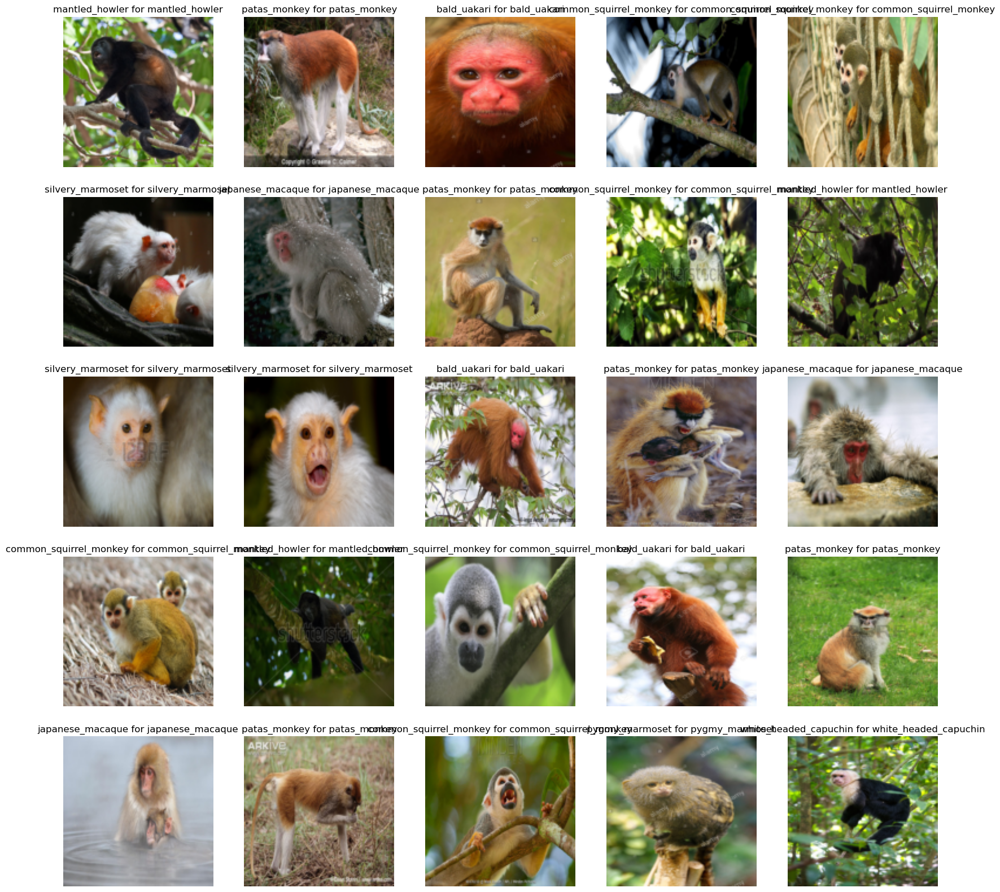

In [101]:
#Plot some examples of correct predictions. 
pltsize=4
row_images = 5
col_images = 5

maxtoshow = row_images * col_images
corrects = y_pred == y_true
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(test_size):
    if ii>=maxtoshow:
        break
    if (corrects[i]):
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(np.transpose(X_test_cat[i], (1, 2, 0)))
        plt.title("{} for {}".format(label_names[y_pred[i]], label_names[y_true[i]]))
        ii = ii + 1

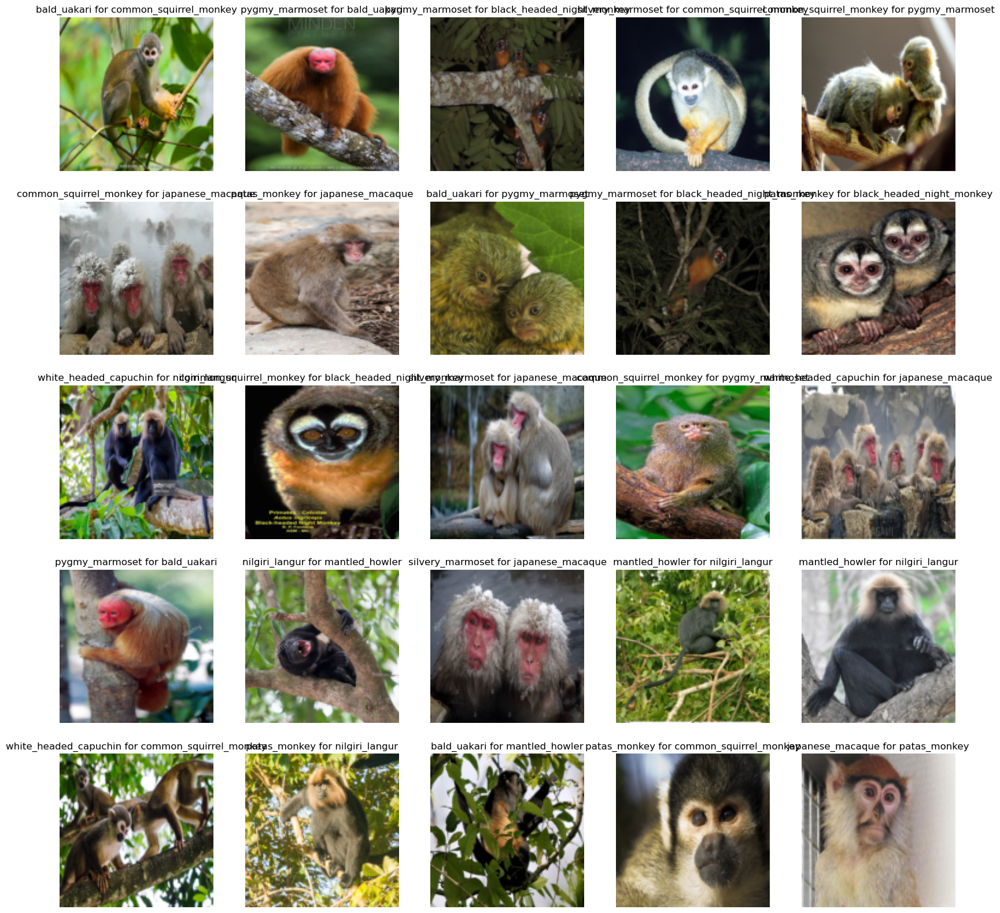

In [102]:
#Plot some examples of incorrect predictions. 
pltsize=4
row_images = 5
col_images = 5

maxtoshow = row_images * col_images
errors = y_pred != y_true
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(test_size):
    if ii>=maxtoshow:
        break
    if (errors[i]):
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(np.transpose(X_test_cat[i], (1, 2, 0)))
        plt.title("{} for {}".format(label_names[y_pred[i]], label_names[y_true[i]]))
        ii = ii + 1

### Importing fine-tuned VGG-16 model with pre-trained features to my network beside of CNN layers and training only the fully connected network layers

In [39]:
#First load a VGG-16 model pre-trained on the Image Net dataset. 
model = vgg16(pretrained=True)

/home/pelin/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/pelin/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [40]:
#Freeze the weights of the pre-trained layers
for param in model.parameters():
    param.requires_grad = False

In [41]:
#Get the input size of the fully connected layer
input_size = model.classifier[0].in_features

In [42]:
#Replace the fully connected layers.
num_classes = len(dataset.classes)
model.classifier = nn.Sequential(
    nn.Linear(input_size, 4096),
    nn.ReLU(inplace=True),
    nn.Dropout(),
    nn.Linear(4096, 4096),
    nn.ReLU(inplace=True),
    nn.Dropout(),
    nn.Linear(4096, num_classes)
)

In [43]:
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [44]:
#Train Model
#Define the model training loop keeping track of some key attributes along the way. 
epochs = 5

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Define lists to store the training and validation loss and accuracy for each epoch
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
    model.train()

    # Initialize the training loss and accuracy for this epoch
    running_train_loss = 0.0
    running_train_corrects = 0

    running_val_loss = 0.0
    running_val_corrects = 0

    for i, (X_train, y_train) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

        # Compute statistics
        running_train_loss += loss.item() * batch_size
        running_train_corrects += torch.sum(torch.argmax(outputs, dim=1) == y_train)
    
    # Compute statistics for the entire epoch
    epoch_train_loss = running_train_loss / train_size
    epoch_train_acc = running_train_corrects.item() / train_size * 100

    # Append the training statistics to the lists
    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_acc)

    # Evaluation on validation set
    with torch.no_grad():
        for i, (X_val, y_val) in enumerate(val_loader):
            val_outputs = model(X_val)
            val_loss = criterion(val_outputs, y_val)
            val_corrects = torch.sum(torch.argmax(val_outputs, dim=1) == y_val)

            # Compute statistics
            running_val_loss += val_loss.item() * batch_size
            running_val_corrects += torch.sum(torch.argmax(val_outputs, dim=1) == y_val)

              
    # Compute statistics for the entire epoch
    epoch_val_loss = running_val_loss / val_size
    epoch_val_acc = running_val_corrects.item() / val_size * 100

    # Append the validation statistics to the lists
    val_losses.append(epoch_val_loss)
    val_accuracies.append(epoch_val_acc)

    print(f'Epoch {epoch+1}/{epochs}, Training Loss: {epoch_train_loss:.4f}, Training Accuracy: {epoch_train_acc:.2f}%, \
          Validation Loss: {epoch_val_loss:.4f}, Validation Accuracy: {epoch_val_acc:.2f}%')

Epoch 1/5, Training Loss: 10.6899, Training Accuracy: 23.10%,           Validation Loss: 1.5740, Validation Accuracy: 51.82%
Epoch 2/5, Training Loss: 0.8826, Training Accuracy: 72.22%,           Validation Loss: 1.3864, Validation Accuracy: 72.26%
Epoch 3/5, Training Loss: 0.3144, Training Accuracy: 90.35%,           Validation Loss: 1.7616, Validation Accuracy: 67.15%
Epoch 4/5, Training Loss: 0.4054, Training Accuracy: 88.01%,           Validation Loss: 1.5852, Validation Accuracy: 69.34%
Epoch 5/5, Training Loss: 0.3674, Training Accuracy: 91.23%,           Validation Loss: 1.0620, Validation Accuracy: 76.64%


### 4. Evaluating the performance of model that utilised fine-tuned VGG-16 

In [45]:
#Evaluate Model
#Generate some simple summary statistics of model performance. 
X_test_cat = []
y_true = []
y_pred = []
for i, (X_test, y_test) in enumerate(test_loader):
    test_outputs = model(X_test)
    _, preds = torch.max(test_outputs, 1)

    # Add up the predictions
    X_test_cat.extend(X_test)
    y_true.extend(y_test)
    y_pred.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
# Print performance details
print(metrics.classification_report(y_true, y_pred))

# Print confusion matrix 
print("Confusion Matrix")
display(pd.crosstab(y_true, y_pred, rownames=['True'], colnames=['Predicted'], margins=True))

              precision    recall  f1-score   support

           0       0.83      0.86      0.84        22
           1       0.78      0.39      0.52        18
           2       0.47      0.91      0.62        22
           3       0.74      0.74      0.74        27
           4       1.00      0.58      0.73        19
           5       0.79      0.58      0.67        19
           6       0.95      0.86      0.90        21
           7       0.84      0.78      0.81        27
           8       0.67      0.75      0.71        16
           9       0.56      0.64      0.60        14

    accuracy                           0.72       205
   macro avg       0.76      0.71      0.71       205
weighted avg       0.77      0.72      0.72       205

Confusion Matrix


Predicted,0,1,2,3,4,5,6,7,8,9,All
True,,,,,,,,,,,
0,19,0,1,1,0,0,0,0,0,1,22
1,1,7,8,1,0,0,0,1,0,0,18
2,0,1,20,0,0,0,0,0,0,1,22
3,1,0,0,20,0,0,0,1,5,0,27
4,0,1,4,0,11,2,0,1,0,0,19
5,1,0,2,0,0,11,1,1,0,3,19
6,0,0,2,1,0,0,18,0,0,0,21
7,0,0,3,1,0,1,0,21,1,0,27
8,0,0,1,1,0,0,0,0,12,2,16


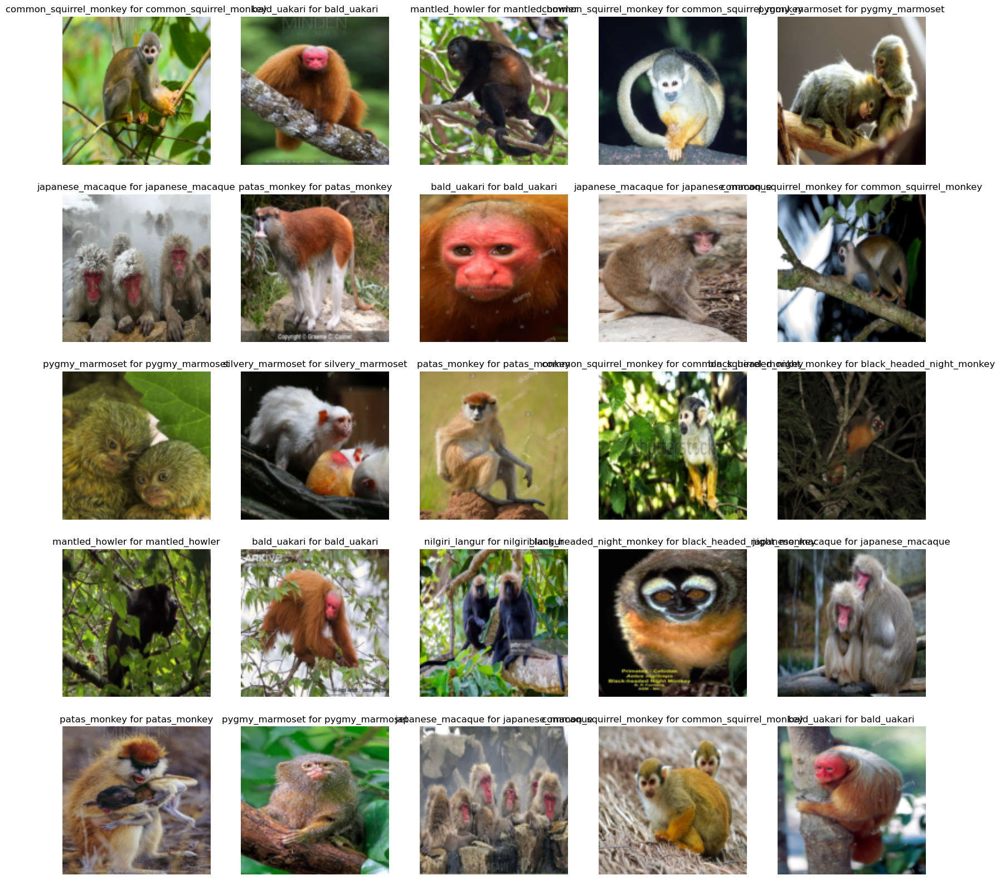

In [46]:
#correct predicted samples
pltsize=4
row_images = 5
col_images = 5

maxtoshow = row_images * col_images
corrects = y_pred == y_true
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(test_size):
    if ii>=maxtoshow:
        break
    if (corrects[i]):
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(np.transpose(X_test_cat[i], (1, 2, 0)))
        plt.title("{} for {}".format(label_names[y_pred[i]], label_names[y_true[i]]))
        ii = ii + 1

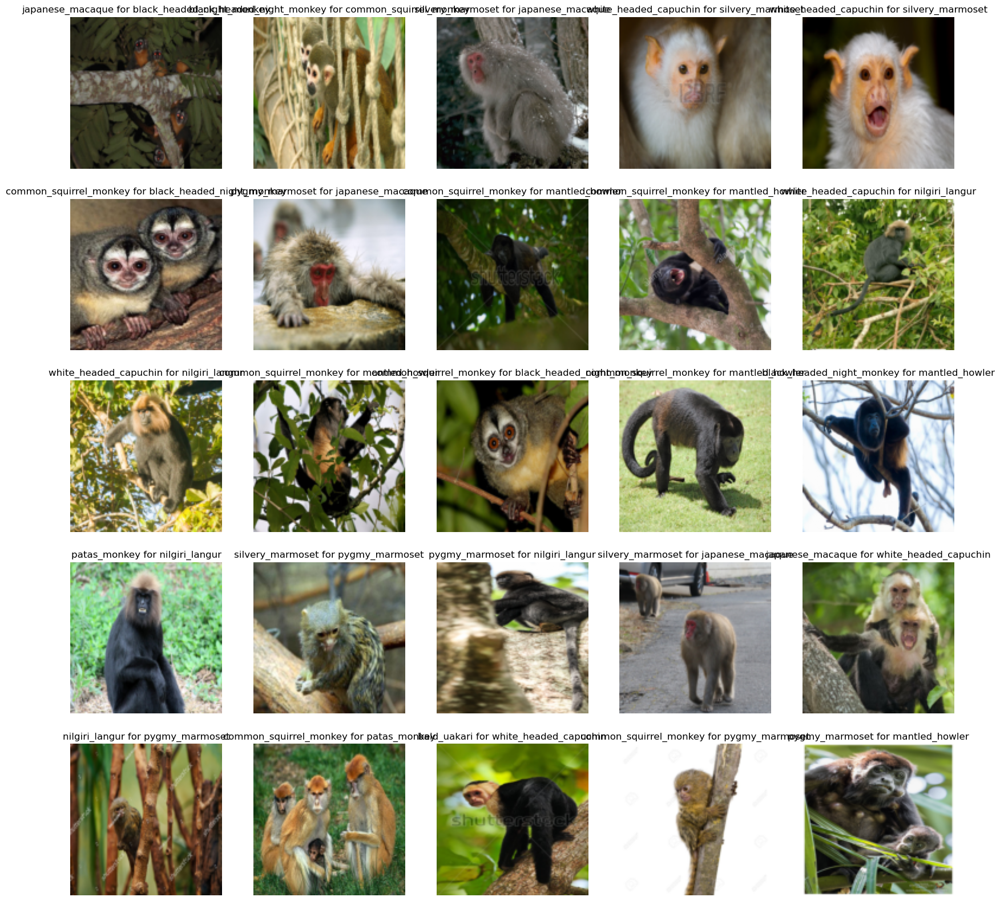

In [47]:
#incorrect predicted samples
pltsize=4
row_images = 5
col_images = 5

maxtoshow = row_images * col_images
errors = y_pred != y_true
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(test_size):
    if ii>=maxtoshow:
        break
    if (errors[i]):
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(np.transpose(X_test_cat[i], (1, 2, 0)))
        plt.title("{} for {}".format(label_names[y_pred[i]], label_names[y_true[i]]))
        ii = ii + 1